In [172]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from sklearn import preprocessing 
import sklearn.linear_model as lm 
from sklearn.metrics import accuracy_score,roc_auc_score,confusion_matrix,classification_report

In [126]:
NHL=pd.read_csv('/Users/jeanzhang/Desktop/nhl04to18/NHL.csv',sep=',',encoding='latin-1')
NHL.shape
NHL.info()
NHL.describe()

NHL.Pos

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13056 entries, 0 to 13055
Data columns (total 31 columns):
Rk            13056 non-null int64
Player        13056 non-null object
Age           13056 non-null int64
Pos           13056 non-null object
Tm            13056 non-null object
GP            13056 non-null int64
G             13056 non-null int64
A             13056 non-null int64
PTS           13056 non-null int64
plusminus     13056 non-null int64
PIM           13056 non-null int64
PS            13056 non-null float64
EV            13056 non-null int64
PP            13056 non-null int64
SH            13056 non-null int64
GW            13056 non-null int64
EV.1          13056 non-null int64
PP.1          13056 non-null int64
SH.1          13056 non-null int64
S             13056 non-null int64
S_percent     12955 non-null float64
TOI           13056 non-null int64
ATOI          13056 non-null float64
BLK           13056 non-null int64
HIT           13056 non-null int64
FOW    

0         C
1         C
2        RW
3         C
4        RW
5        LW
6         C
7         C
8         D
9        RW
10       LW
11       RW
12        C
13        C
14        C
15        D
16        D
17       RW
18       RW
19        C
20       LW
21       LW
22        C
23        C
24       LW
25       LW
26        C
27        C
28        C
29       RW
         ..
13026     D
13027    RW
13028    LW
13029     D
13030    LW
13031    RW
13032    RW
13033    LW
13034    RW
13035     C
13036    LW
13037     D
13038     C
13039    RW
13040     D
13041    LW
13042    RW
13043    RW
13044     C
13045     C
13046     D
13047     C
13048     D
13049    RW
13050     C
13051     C
13052     C
13053    RW
13054     D
13055    RW
Name: Pos, Length: 13056, dtype: object

In [121]:
NHL = NHL.dropna()
NHL.shape
NHL.head(10)






,Rk,Player,Age,Pos,Tm,GP,G,A,PTS,plusminus,...,TOI,ATOI,BLK,HIT,FOW,FOL,FO_percent,HART,Votes,Season
0,1,Connor McDavid\mcdavco01,20,C,EDM,82,30,70,100,27,...,1733,21.133333,29,34,348,458,43.2,1,1604,2017
1,2,Sidney Crosby\crosbsi01,29,C,PIT,75,44,45,89,17,...,1491,19.883333,27,80,842,906,48.2,0,1104,2017
2,3,Patrick Kane\kanepa01,28,RW,CHI,82,34,55,89,11,...,1754,21.400000,15,28,7,44,13.7,0,206,2017
3,4,Nicklas Backstrom\backsni02,29,C,WSH,82,23,63,86,17,...,1497,18.266667,33,45,685,648,51.4,0,60,2017
4,5,Nikita Kucherov\kucheni01,23,RW,TBL,74,40,45,85,13,...,1438,19.433333,20,30,0,0,0.0,0,119,2017
5,6,Brad Marchand\marchbr03,28,LW,BOS,80,39,46,85,18,...,1555,19.433333,35,51,13,23,36.1,0,184,2017
6,7,Mark Scheifele\scheima01,23,C,WPG,79,32,50,82,18,...,1624,20.566667,34,49,635,826,43.5,0,0,2017
7,8,Leon Draisaitl\draisle01,21,C,EDM,82,29,48,77,7,...,1548,18.883333,36,41,476,496,49.0,0,0,2017
8,9,Brent Burns\burnsbr01,31,D,SJS,82,29,47,76,19,...,2039,0.866667,142,69,0,0,0.0,0,273,2017
9,10,Vladimir Tarasenko\tarasvl01,25,RW,STL,82,39,36,75,-1,...,1515,18.466667,31,50,5,5,50.0,0,0,2017


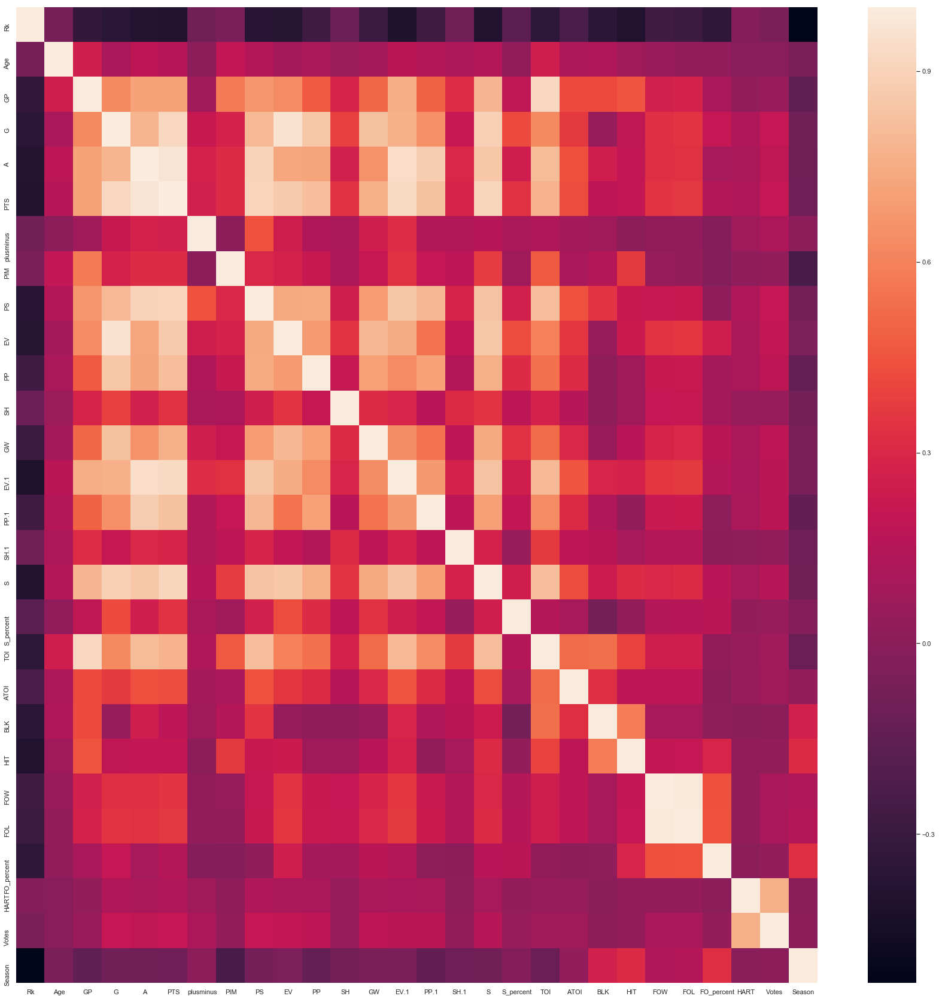

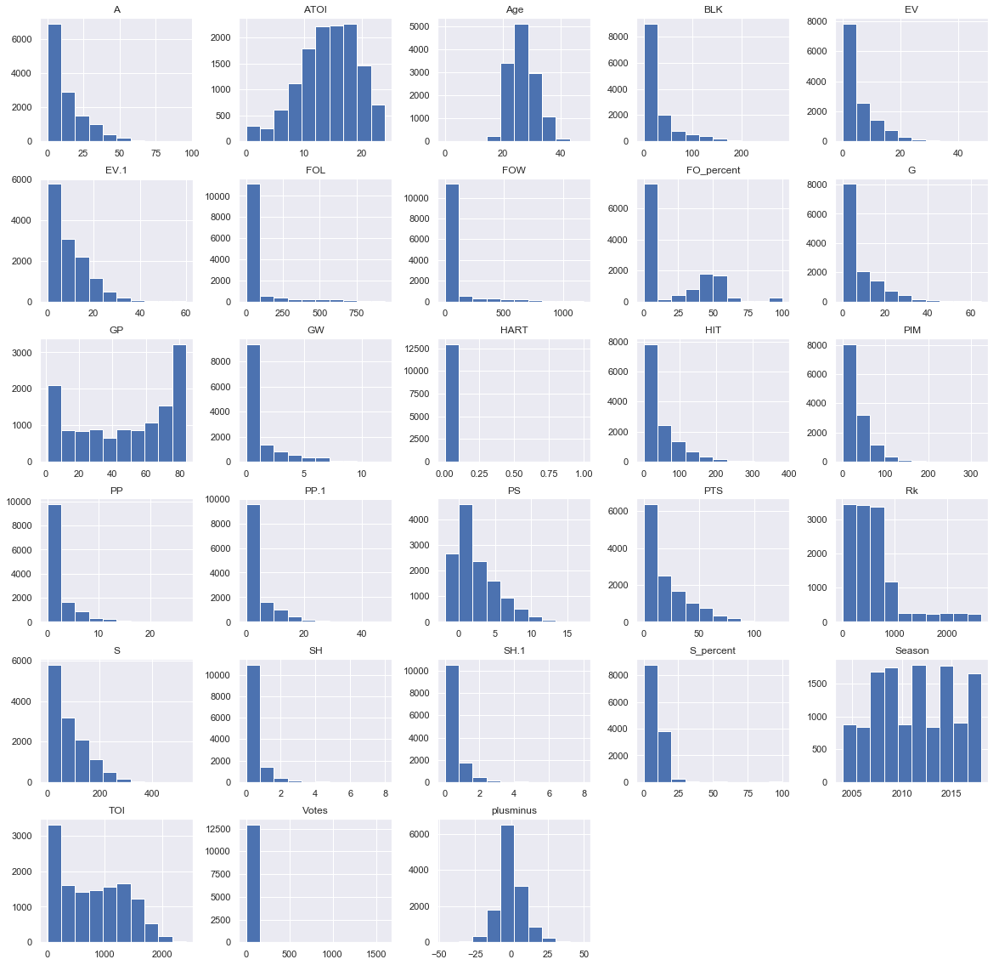

In [93]:
plt.figure(figsize=(30,30))
sns.heatmap(NHL.corr())

NHL.hist(figsize=(20,20))
plt.show()



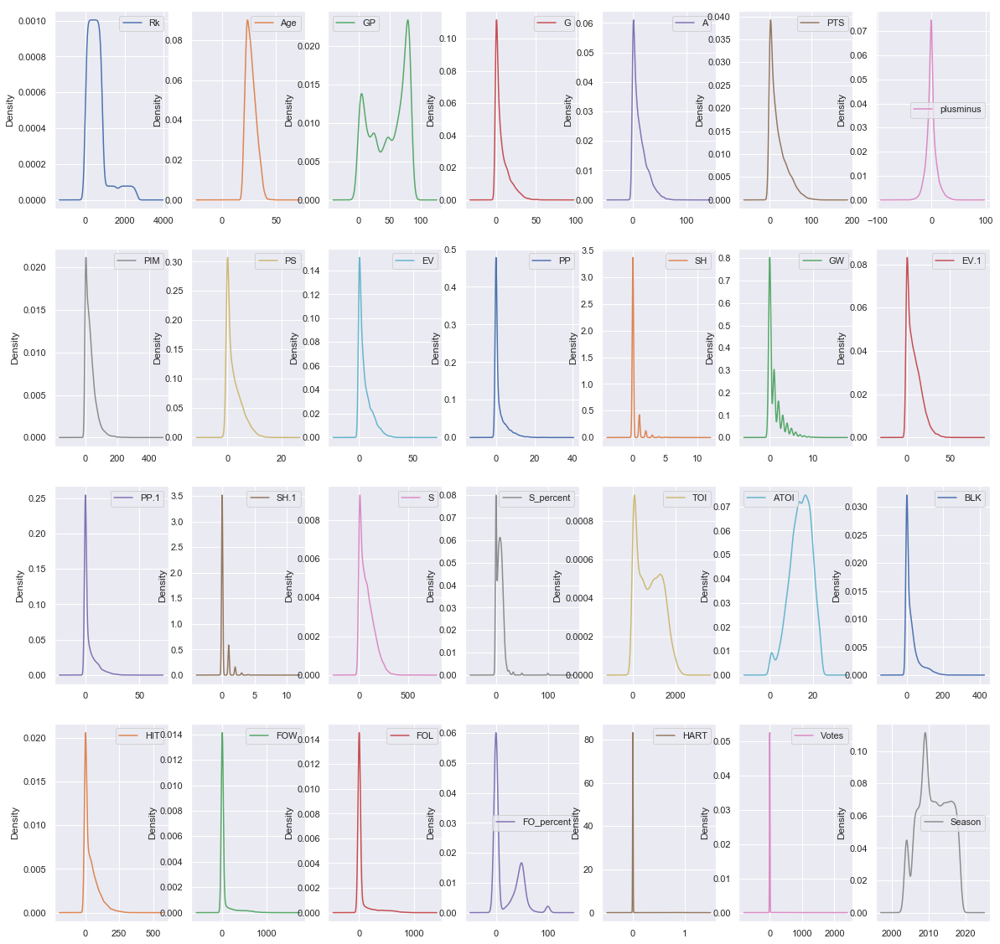

In [92]:
NHL.plot(kind='density',subplots=True,sharex=False,figsize=(20,20),layout=(4,7))
plt.show()



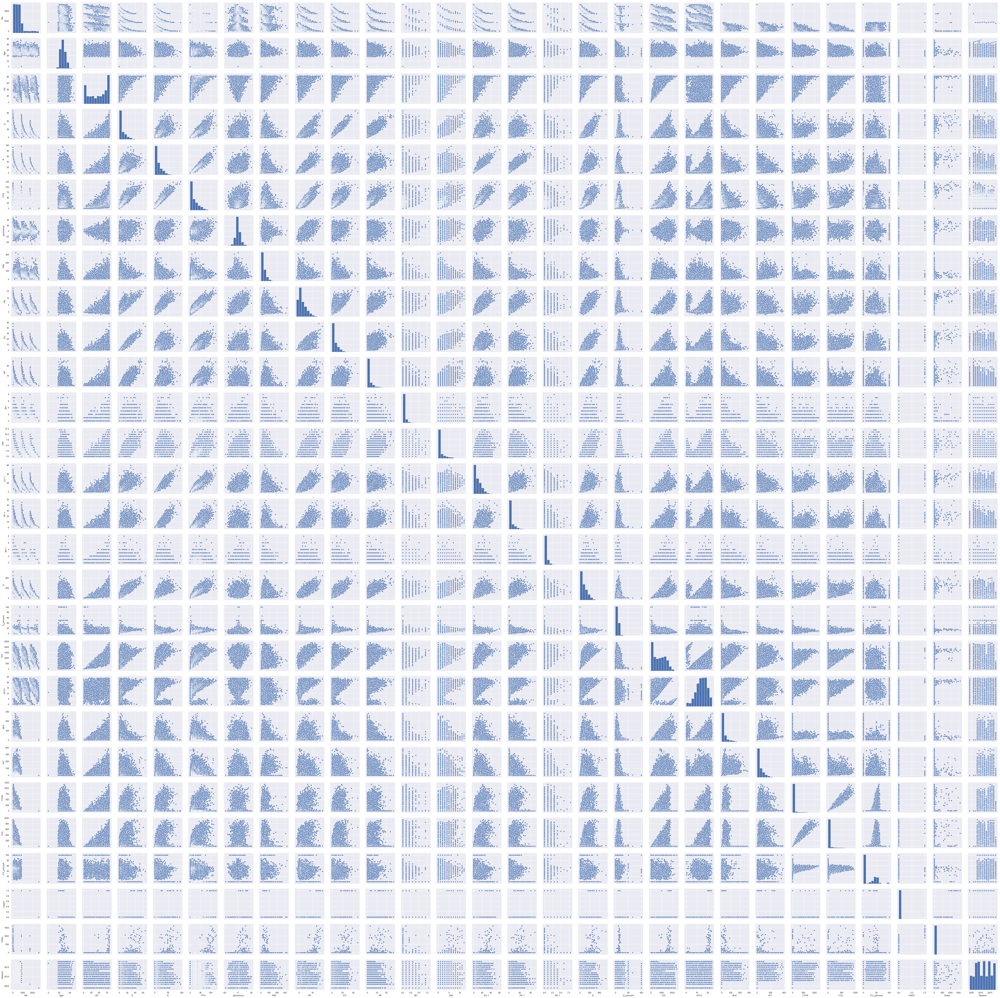

In [81]:
sns.set()
sns.pairplot(NHL)

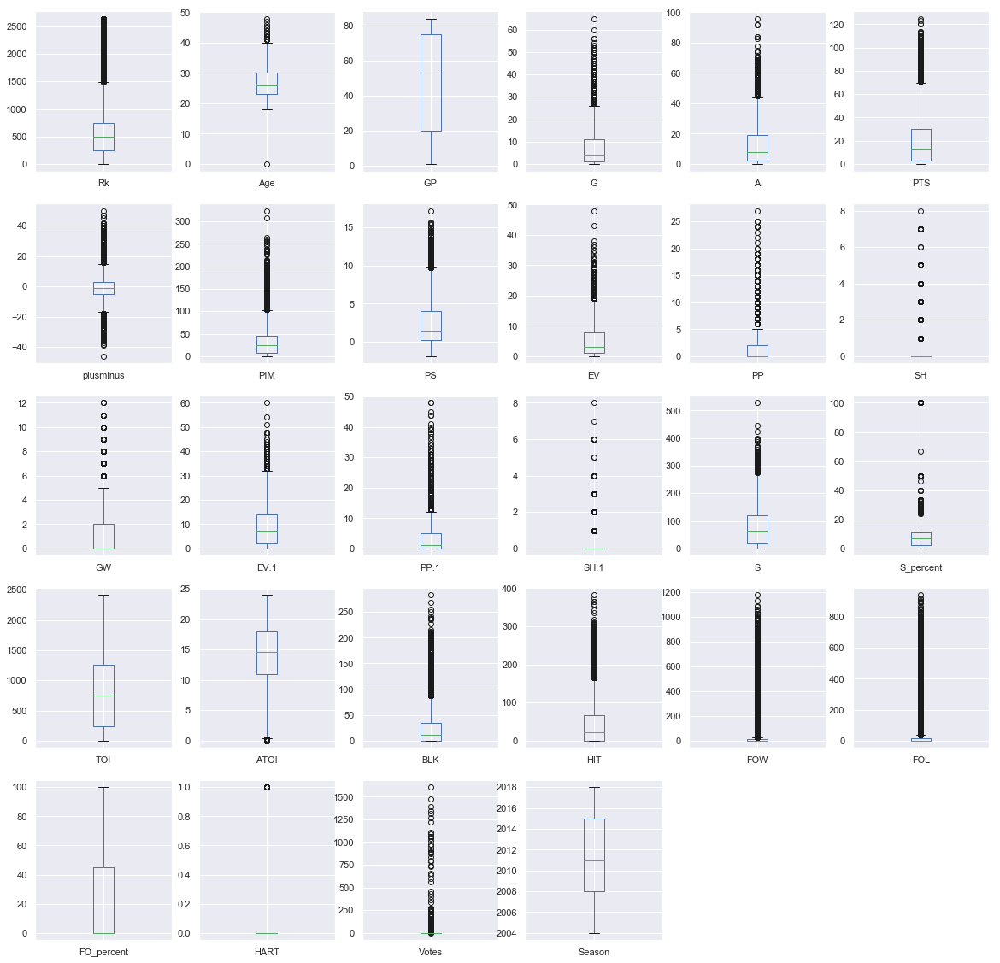

In [91]:

NHL.plot(kind='box',subplots=True,figsize=(20,20),layout=(5,6))
plt.show()

In [159]:
NHL=NHL.dropna()
NHL.Pos = pd.factorize(NHL.Pos)[0]
NHL.Tm = pd.factorize(NHL.Tm)[0]

train=NHL[NHL['Season'] <= 2013]
test=NHL[NHL['Season'] > 2013]

train.shape
test.shape
NHL.Pos.head()
NHL.Tm.head()

NHL.info()



<class 'pandas.core.frame.DataFrame'>
Int64Index: 12955 entries, 0 to 13055
Data columns (total 31 columns):
Rk            12955 non-null int64
Player        12955 non-null object
Age           12955 non-null int64
Pos           12955 non-null int64
Tm            12955 non-null int64
GP            12955 non-null int64
G             12955 non-null int64
A             12955 non-null int64
PTS           12955 non-null int64
plusminus     12955 non-null int64
PIM           12955 non-null int64
PS            12955 non-null float64
EV            12955 non-null int64
PP            12955 non-null int64
SH            12955 non-null int64
GW            12955 non-null int64
EV.1          12955 non-null int64
PP.1          12955 non-null int64
SH.1          12955 non-null int64
S             12955 non-null int64
S_percent     12955 non-null float64
TOI           12955 non-null int64
ATOI          12955 non-null float64
BLK           12955 non-null int64
HIT           12955 non-null int64
FOW      

In [160]:
train.Season.unique()

array([2013, 2012, 2011, 2010, 2009, 2008, 2007, 2006, 2004])

In [161]:
test.Season.unique()

array([2017, 2016, 2015, 2014, 2018])

In [162]:
Y_train=train.HART
Y_test=test.HART

In [163]:
X_train=train.drop(['HART','Votes','Player'], axis=1) 
X_train=preprocessing.scale(X_train.astype(float))

X_test=preprocessing.scale(test.drop(['HART','Votes','Player'],axis=1).astype(float))

In [164]:
lreg=lm.LogisticRegression()
lreg.fit(X_train,Y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [174]:
Y_hat=lreg.predict(X_test)
accuracy=accuracy_score(Y_hat,Y_test)
cm = confusion_matrix(Y_hat,Y_test)
print('accuracy_score',accuracy)
print('confusion_matrix \n',cm)
print('classification report \n',classification_report(Y_hat,Y_test))

accuracy_score 0.999072786277237
confusion_matrix 
 [[4310    4]
 [   0    0]]
classification report 
              precision    recall  f1-score   support

          0       1.00      1.00      1.00      4314
          1       0.00      0.00      0.00         0

avg / total       1.00      1.00      1.00      4314



/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1137: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


In [175]:
lreg.predict_proba(X_test)[0:20]

array([[0.81313712, 0.18686288],
       [0.96775657, 0.03224343],
       [0.97233353, 0.02766647],
       [0.97659859, 0.02340141],
       [0.95460772, 0.04539228],
       [0.87668955, 0.12331045],
       [0.98317613, 0.01682387],
       [0.98723832, 0.01276168],
       [0.97875169, 0.02124831],
       [0.98631243, 0.01368757],
       [0.99317185, 0.00682815],
       [0.9866617 , 0.0133383 ],
       [0.98289821, 0.01710179],
       [0.98070759, 0.01929241],
       [0.99674349, 0.00325651],
       [0.95823734, 0.04176266],
       [0.98183247, 0.01816753],
       [0.98630023, 0.01369977],
       [0.99688649, 0.00311351],
       [0.99292839, 0.00707161]])

In [186]:
y_pred_proba=lreg.predict_proba(X_test)[:,1]
y_pred_proba
test['pred_proba']=y_pred_proba
test.head()

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,Rk,Player,Age,Pos,Tm,GP,G,A,PTS,plusminus,...,ATOI,BLK,HIT,FOW,FOL,FO_percent,HART,Votes,Season,pred_proba
0,1,Connor McDavid\mcdavco01,20,0,0,82,30,70,100,27,...,21.133333,29,34,348,458,43.2,1,1604,2017,0.186863
1,2,Sidney Crosby\crosbsi01,29,0,1,75,44,45,89,17,...,19.883333,27,80,842,906,48.2,0,1104,2017,0.032243
2,3,Patrick Kane\kanepa01,28,1,2,82,34,55,89,11,...,21.400000,15,28,7,44,13.7,0,206,2017,0.027666
3,4,Nicklas Backstrom\backsni02,29,0,3,82,23,63,86,17,...,18.266667,33,45,685,648,51.4,0,60,2017,0.023401
4,5,Nikita Kucherov\kucheni01,23,1,4,74,40,45,85,13,...,19.433333,20,30,0,0,0.0,0,119,2017,0.045392


In [200]:
mvp2017 = test[(test['Season'] == 2017) & (test['pred_proba']>0)]
mvp2018 = test[(test['Season'] == 2018) & (test['pred_proba']>0)]

mvp2018.sort_values(by='pred_proba',ascending=False)

,Rk,Player,Age,Pos,Tm,GP,G,A,PTS,plusminus,...,ATOI,BLK,HIT,FOW,FOL,FO_percent,HART,Votes,Season,pred_proba
9652,1,Nikita Kucherov\kucheni01,24,1,4,26,19,19,38,8,...,20.800000,4,10,1,0,100.0,0,0,2018,0.003141
9654,3,Johnny Gaudreau\gaudrjo01,24,2,22,26,12,24,36,4,...,18.933333,3,2,1,3,25.0,0,0,2018,0.003136
9749,98,Mikhail Sergachev\sergami01,19,3,4,26,6,12,18,7,...,14.516667,14,27,0,0,0.0,0,0,2018,0.002926
9661,10,Brayden Schenn\schenbr01,26,0,8,27,10,20,30,19,...,19.566667,10,48,208,237,46.7,0,0,2018,0.002871
9655,4,Blake Wheeler\wheelbl01,31,1,6,27,7,28,35,7,...,20.566667,19,24,14,20,41.2,0,0,2018,0.002861
10406,755,Tage Thompson\thompta01,20,0,8,4,0,0,0,-3,...,10.083333,0,5,0,0,0.0,0,0,2018,0.002748
9686,35,Evander Kane\kaneev01,26,2,24,27,12,12,24,-3,...,20.150000,10,51,48,61,44.0,0,0,2018,0.002698
9656,5,Mark Scheifele\scheima01,24,0,6,27,14,20,34,11,...,21.216667,13,26,285,280,50.4,0,0,2018,0.002641
9833,182,Charlie McAvoy\mcavoch01,20,3,5,24,3,11,14,0,...,23.583333,29,62,0,0,0.0,0,0,2018,0.002603
9690,39,John Klingberg\klingjo01,25,3,10,27,4,20,24,3,...,23.516667,40,10,0,0,0.0,0,0,2018,0.002551


In [201]:
print('Mean of MVP 2017 predicted probability:', mvp2017['pred_proba'].mean())
print('Mean of MVP 2017 predicted probability:', mvp2018['pred_proba'].mean())

Mean of MVP 2017 predicted probability: 0.0018752505402413195
Mean of MVP 2017 predicted probability: 0.0009650266368395687


In [202]:
mvp2017 = mvp2017[mvp2017['pred_proba']> 0.00188]
mvp2018 = mvp2018[mvp2018['pred_proba']> 0.001]


In [204]:
mvp2017.pred_proba.describe()

count    148.000000
mean       0.007454
std        0.019027
min        0.001884
25%        0.002151
50%        0.002739
75%        0.004978
max        0.186863
Name: pred_proba, dtype: float64

In [205]:
mvp2018.pred_proba.describe()

count    296.000000
mean       0.001485
std        0.000431
min        0.001000
25%        0.001168
50%        0.001373
75%        0.001659
max        0.003141
Name: pred_proba, dtype: float64

In [207]:
mvp2017_output = mvp2017[['Player','pred_proba']]
mvp2018_output = mvp2018[['Player','pred_proba']]

In [210]:
mvp2017_output.sort_values(by='pred_proba',ascending=False).head(15)

,Player,pred_proba
0,Connor McDavid\mcdavco01,0.186863
5,Brad Marchand\marchbr03,0.123310
4,Nikita Kucherov\kucheni01,0.045392
15,Victor Hedman\hedmavi01,0.041763
1,Sidney Crosby\crosbsi01,0.032243
2,Patrick Kane\kanepa01,0.027666
3,Nicklas Backstrom\backsni02,0.023401
8,Brent Burns\burnsbr01,0.021248
13,Evgeni Malkin\malkiev01,0.019292
16,Erik Karlsson\karlser01,0.018168


In [211]:
mvp2018_output.sort_values(by='pred_proba',ascending=False).head(15)

,Player,pred_proba
9652,Nikita Kucherov\kucheni01,0.003141
9654,Johnny Gaudreau\gaudrjo01,0.003136
9749,Mikhail Sergachev\sergami01,0.002926
9661,Brayden Schenn\schenbr01,0.002871
9655,Blake Wheeler\wheelbl01,0.002861
10406,Tage Thompson\thompta01,0.002748
9686,Evander Kane\kaneev01,0.002698
9656,Mark Scheifele\scheima01,0.002641
9833,Charlie McAvoy\mcavoch01,0.002603
9690,John Klingberg\klingjo01,0.002551
